# Grouping online shopping traffic by purchasing intention

Of the 12,330 sessions in this dataset, 84.5% (10,422) were negative class samples that did not end with shopping, and the rest (1908) were positive class samples ending with shopping. The target variable "Revenue" is a boolean value representing whether the samples ended with shopping(TRUE) or not (FALSE).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import scipy
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import datasets, metrics
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score

In [3]:
df = pd.read_csv('online_shoppers_intention.csv')

In [4]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
print(df['Revenue'])

0        False
1        False
2        False
3        False
4        False
         ...  
12325    False
12326    False
12327    False
12328    False
12329    False
Name: Revenue, Length: 12330, dtype: bool


In [8]:
df_encoded = pd.concat([df, pd.get_dummies(df["Month"], drop_first=True)], axis=1)
df_encoded = pd.concat([df_encoded, pd.get_dummies(df["VisitorType"], drop_first=True)], axis=1)
df_encoded = pd.concat([df_encoded, pd.get_dummies(df["Weekend"], drop_first=True)], axis=1)


# Drop the character columns
df_encoded.drop(['Month', 'VisitorType', 'Weekend'], axis = 1, inplace = True)

# Encode the target column
df_encoded.loc[df_encoded['Revenue'] == 'false', 'Revenue'] = 0
df_encoded.loc[df_encoded['Revenue'] == 'true', 'Revenue'] = 1


df_encoded.head(10)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Jul,June,Mar,May,Nov,Oct,Sep,Other,Returning_Visitor,True
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,1
5,0,0.0,0,0.0,19,154.216667,0.015789,0.024561,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0
6,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.4,...,0,0,0,0,0,0,0,0,1,0
7,1,0.0,0,0.0,0,0.000000,0.200000,0.200000,0.0,0.0,...,0,0,0,0,0,0,0,0,1,1
8,0,0.0,0,0.0,2,37.000000,0.000000,0.100000,0.0,0.8,...,0,0,0,0,0,0,0,0,1,0
9,0,0.0,0,0.0,3,738.000000,0.000000,0.022222,0.0,0.4,...,0,0,0,0,0,0,0,0,1,0


### DATA PREP - Choosing 10,000 random data points to limit computational capacity

In [18]:
np.random.seed(123)

indices = np.random.choice(len(df), 10000)
X = df_encoded.drop('Revenue', axis = 1).loc[indices] 
y = df_encoded['Revenue'].loc[indices]

print(X.shape, y.shape)

(10000, 26) (10000,)


In [20]:
X.columns = X.columns.astype(str)

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [21]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

### Plotting clusters with k-means

In [22]:
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_pca)
centroids = kmeans.cluster_centers_
labels = kmeans.labels_
labels_pred = kmeans.fit_predict(X_pca)

# Compute ARI score
ari_score = adjusted_rand_score(y, labels_pred)
print("Adjusted Rand Index of the K-Means solution: {}", ari_score)

silhouette_avg = silhouette_score(X_pca, labels)
print("The silhouette score of the K-Means solution: {}", silhouette_avg)

/Users/haleyallen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/haleyallen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Adjusted Rand Index of the K-Means solution: {} 0.022039995119521035
The silhouette score of the K-Means solution: {} 0.3580290249123604


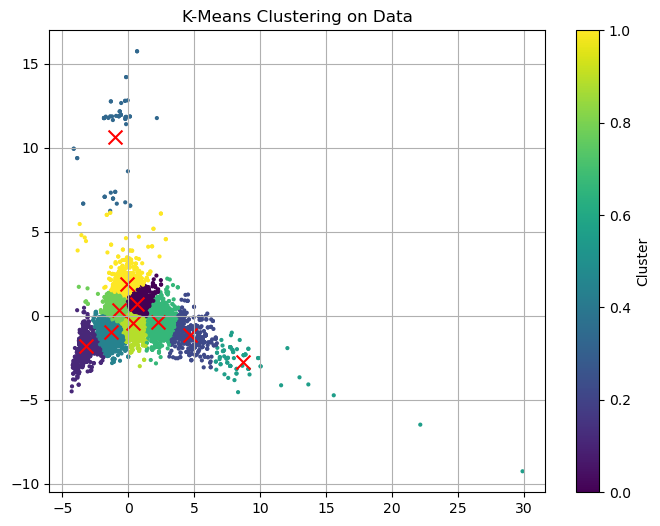

In [23]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=4)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, color='r')
plt.title('K-Means Clustering on Data')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

Customers are grouped in to 10 different clusters

### Plotting clusters with hierarchical clustering

In [25]:
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=3)

clusters = agg_cluster.fit_predict(X_std)

print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

/Users/haleyallen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Adjusted Rand Index of the Agglomerative Clustering solution: -0.04911155523070142
The silhouette score of the Agglomerative Clustering solution: -0.006114257881844566


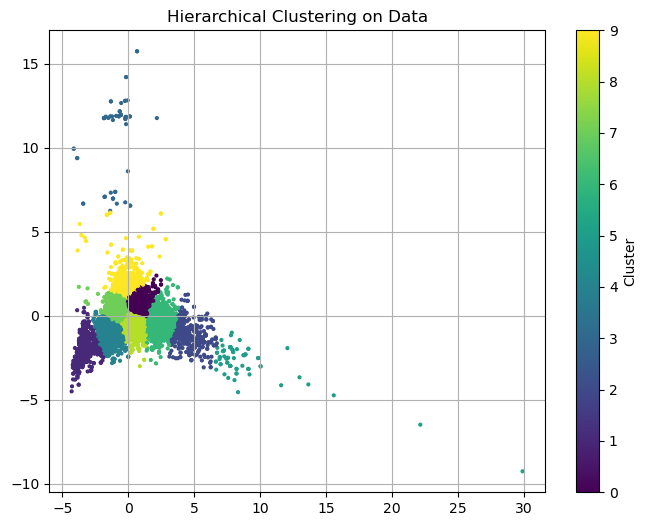

In [26]:
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=4)
plt.title('Hierarchical Clustering on Data')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

### The ARI score for the agglomerative clustering approach is `-0.0491`. That's lower than the score for k-means, which was `0.0220`. The silhouette score of the agglomerative clustering approach is `-0.0061`, which is lower than that of the k-means, which was `0.358`. Overall, the K-Means clustering seems to out perform the agglomerative clustering and would be the better algorithm to use.

## Dimensionality reduction with t-SNE

In [27]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.003s...
[t-SNE] Computed neighbors for 10000 samples in 0.456s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 4.959661
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.477798
[t-SNE] KL divergence after 300 iterations: 2.042310
t-SNE done! Time elapsed:

In [28]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The different groups are not very identifiable